In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import plotly.express as px

c:\Users\seono\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
df_train = pd.read_csv(r"C:\Users\seono\flight\data\train.csv")

In [3]:
df_train.isnull().sum()

ID                               0
Month                            0
Day_of_Month                     0
Estimated_Departure_Time    109019
Estimated_Arrival_Time      109040
Cancelled                        0
Diverted                         0
Origin_Airport                   0
Origin_Airport_ID                0
Origin_State                109015
Destination_Airport              0
Destination_Airport_ID           0
Destination_State           109079
Distance                         0
Airline                     108920
Carrier_Code(IATA)          108990
Carrier_ID(DOT)             108997
Tail_Number                      0
Delay                       744999
dtype: int64

In [16]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 20 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   ID                        1000000 non-null  object 
 1   Month                     1000000 non-null  int64  
 2   Day_of_Month              1000000 non-null  int64  
 3   Estimated_Departure_Time  890981 non-null   float64
 4   Estimated_Arrival_Time    890960 non-null   float64
 5   Cancelled                 1000000 non-null  int64  
 6   Diverted                  1000000 non-null  int64  
 7   Origin_Airport            1000000 non-null  object 
 8   Origin_Airport_ID         1000000 non-null  int64  
 9   Origin_State              890985 non-null   object 
 10  Destination_Airport       1000000 non-null  object 
 11  Destination_Airport_ID    1000000 non-null  int64  
 12  Destination_State         890921 non-null   object 
 13  Distance                  10

In [4]:
df_train.head(2)

,ID,Month,Day_of_Month,Estimated_Departure_Time,Estimated_Arrival_Time,Cancelled,Diverted,Origin_Airport,Origin_Airport_ID,Origin_State,Destination_Airport,Destination_Airport_ID,Destination_State,Distance,Airline,Carrier_Code(IATA),Carrier_ID(DOT),Tail_Number,Delay
0,TRAIN_000000,4,15,NaN,NaN,0,0,OKC,13851,Oklahoma,HOU,12191,Texas,419.0,Southwest Airlines Co.,WN,19393.0,N7858A,NaN
1,TRAIN_000001,8,15,740.0,1024.0,0,0,ORD,13930,Illinois,SLC,14869,Utah,1250.0,SkyWest Airlines Inc.,UA,20304.0,N125SY,NaN


In [14]:
fig = px.box(df_train, x='Distance')
fig.show()

In [7]:
df_train.loc[df_train['Distance']>5000]

,ID,Month,Day_of_Month,Estimated_Departure_Time,Estimated_Arrival_Time,Cancelled,Diverted,Origin_Airport,Origin_Airport_ID,Origin_State,Destination_Airport,Destination_Airport_ID,Destination_State,Distance,Airline,Carrier_Code(IATA),Carrier_ID(DOT),Tail_Number,Delay
9233,TRAIN_009233,8,31,920.0,1425.0,0,0,BOS,10721,Massachusetts,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,NaN,19690.0,N391HA,NaN
40956,TRAIN_040956,6,14,1350.0,550.0,0,0,HNL,12173,Hawaii,BOS,10721,Massachusetts,5095.0,NaN,HA,19690.0,N399HA,NaN
50637,TRAIN_050637,9,29,920.0,1420.0,0,0,BOS,10721,Massachusetts,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,HA,19690.0,N399HA,NaN
51166,TRAIN_051166,12,22,920.0,1605.0,0,0,BOS,10721,Massachusetts,HNL,12173,Hawaii,5095.0,NaN,HA,19690.0,N388HA,NaN
158704,TRAIN_158704,10,6,1405.0,550.0,0,0,HNL,12173,Hawaii,BOS,10721,Massachusetts,5095.0,Hawaiian Airlines Inc.,HA,19690.0,N373HA,NaN
175063,TRAIN_175063,10,14,920.0,1435.0,0,0,BOS,10721,Massachusetts,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,HA,19690.0,N361HA,NaN
197683,TRAIN_197683,5,20,920.0,1425.0,0,0,BOS,10721,Massachusetts,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,HA,19690.0,N360HA,NaN
208574,TRAIN_208574,8,6,920.0,1425.0,0,0,BOS,10721,Massachusetts,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,NaN,19690.0,N381HA,NaN
213284,TRAIN_213284,4,13,920.0,1445.0,0,0,BOS,10721,NaN,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,HA,19690.0,N382HA,NaN
241137,TRAIN_241137,10,8,920.0,1435.0,0,0,BOS,10721,NaN,HNL,12173,Hawaii,5095.0,Hawaiian Airlines Inc.,HA,19690.0,N361HA,NaN


In [4]:
df_cor = df_train.select_dtypes(exclude='object')
df_cor.dropna(inplace=True)
df_cor.drop(columns=['Cancelled', 'Diverted', 'Origin_Airport_ID', 'Destination_Airport_ID'], inplace=True)

In [9]:
df_cor.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 707317 entries, 1 to 999999
Data columns (total 6 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     707317 non-null  int64  
 1   Day_of_Month              707317 non-null  int64  
 2   Estimated_Departure_Time  707317 non-null  float64
 3   Estimated_Arrival_Time    707317 non-null  float64
 4   Distance                  707317 non-null  float64
 5   Carrier_ID(DOT)           707317 non-null  float64
dtypes: float64(4), int64(2)
memory usage: 37.8 MB


<AxesSubplot: >

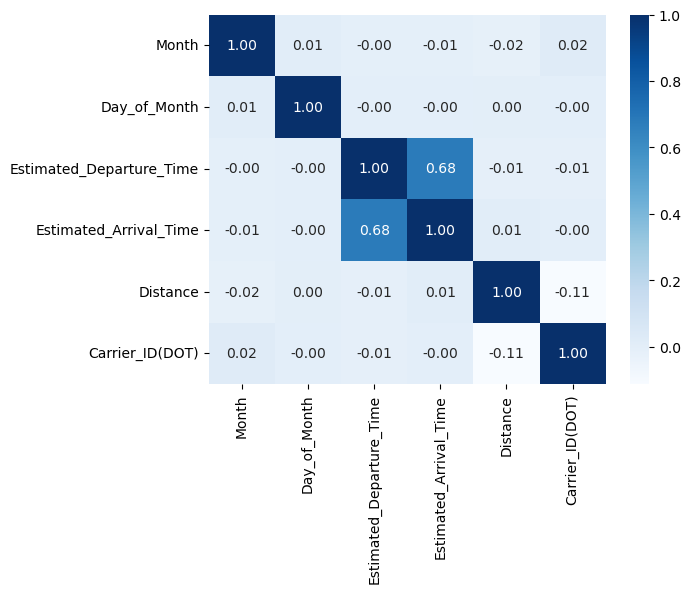

In [11]:
sns.heatmap(df_cor.corr(), annot=True, cmap = 'Blues', fmt=".2f")

In [60]:
df_cor_2 = df_train.select_dtypes(exclude='object')
df_cor_2.dropna(inplace=True)

In [61]:
df_cor_2.drop(columns=['Cancelled', 'Diverted', 'Carrier_ID(DOT)'], inplace=True)

<AxesSubplot: >

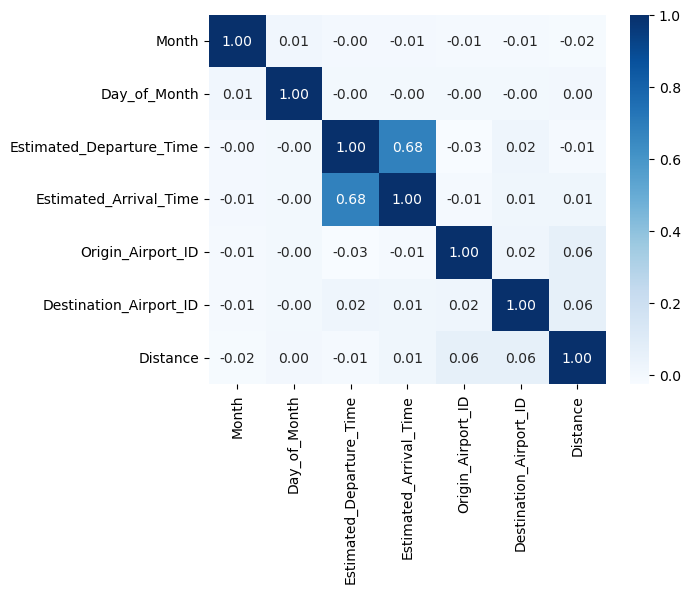

In [62]:
sns.heatmap(df_cor_2.corr(), annot=True, cmap = 'Blues', fmt=".2f")

In [28]:
df_train.head()

,ID,Month,Day_of_Month,Estimated_Departure_Time,Estimated_Arrival_Time,Cancelled,Diverted,Origin_Airport,Origin_Airport_ID,Origin_State,Destination_Airport,Destination_Airport_ID,Destination_State,Distance,Airline,Carrier_Code(IATA),Carrier_ID(DOT),Tail_Number,Delay,Season
0,TRAIN_000000,4,15,NaN,NaN,0,0,OKC,13851,Oklahoma,HOU,12191,Texas,419.0,Southwest Airlines Co.,WN,19393.0,N7858A,NaN,spring
1,TRAIN_000001,8,15,740.0,1024.0,0,0,ORD,13930,Illinois,SLC,14869,Utah,1250.0,SkyWest Airlines Inc.,UA,20304.0,N125SY,NaN,summer
2,TRAIN_000002,9,6,1610.0,1805.0,0,0,CLT,11057,North Carolina,LGA,12953,New York,544.0,American Airlines Inc.,AA,19805.0,N103US,NaN,autumn
3,TRAIN_000003,7,10,905.0,1735.0,0,0,LAX,12892,California,EWR,11618,New Jersey,2454.0,United Air Lines Inc.,UA,NaN,N595UA,NaN,summer
4,TRAIN_000004,1,11,900.0,1019.0,0,0,SFO,14771,California,ACV,10157,California,250.0,SkyWest Airlines Inc.,UA,20304.0,N161SY,NaN,winter


In [6]:
df_train['Delay'].unique()

array([nan, 'Not_Delayed', 'Delayed'], dtype=object)

In [7]:
print(' Delay 분포 :\n', df_train['Delay'].value_counts())

 Delay 분포 :
 Not_Delayed    210001
Delayed         45000
Name: Delay, dtype: int64


<AxesSubplot: xlabel='Delay', ylabel='count'>

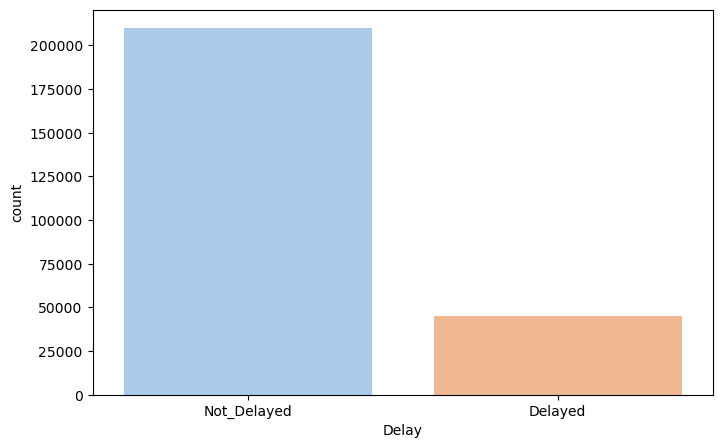

In [19]:
sns.set_palette("pastel")
plt.figure(figsize=(8,5))
sns.countplot(data=df_train, x='Delay')

In [29]:
month_delay = df_train.groupby(['Month', 'Delay'])['ID'].count().unstack().fillna(0)
top = month_delay.sum(axis=1).sort_values(ascending=False).head(20).index
top_data = month_delay.loc[top]
top_data = top_data[['Not_Delayed', 'Delayed']]

In [30]:
top_data = top_data.sort_values(by=["Month"], ascending=[True])
top_data.head()

Delay,Not_Delayed,Delayed
Month,,
1,16531,3348
2,11731,3089
3,15613,3108
4,17877,3474
5,15266,3629


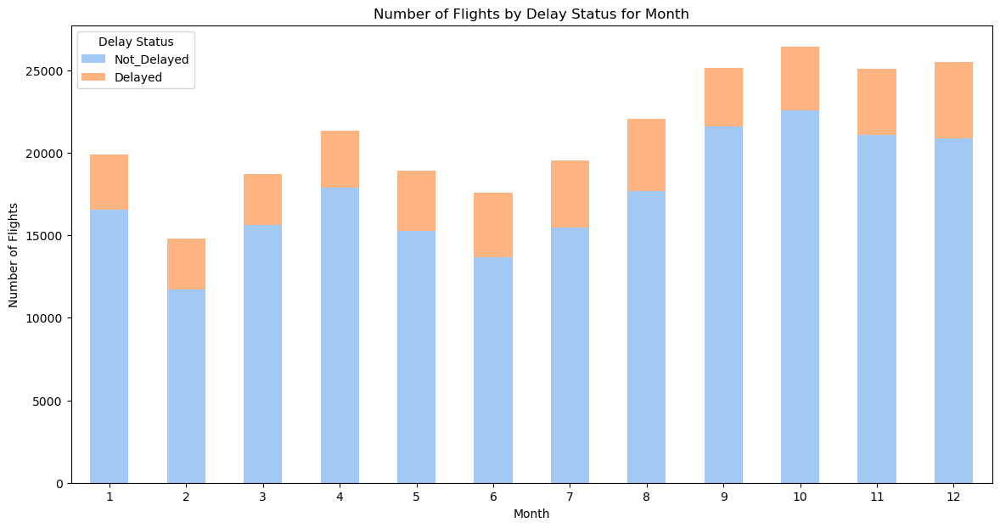

In [36]:
sns.set_palette("pastel")
top_data.plot(kind='bar', stacked=True, figsize=(14, 7))
plt.title('Number of Flights by Delay Status for Month')
plt.ylabel('Number of Flights')
plt.xlabel('Month')
plt.xticks(rotation=0, ha='center')
plt.legend(title='Delay Status')
plt.show()

In [15]:
df_train.describe(include='object')

,ID,Origin_Airport,Origin_State,Destination_Airport,Destination_State,Airline,Carrier_Code(IATA),Tail_Number,Delay
count,1000000,1000000,890985,1000000,890921,891080,891010,1000000,255001
unique,1000000,374,52,375,52,28,11,6430,2
top,TRAIN_000000,ORD,California,ORD,California,Southwest Airlines Co.,UA,N483HA,Not_Delayed
freq,1,50436,103482,50171,104347,182113,206211,530,210001


In [16]:
dealy_airline = df_train[df_train['Delay'] == 'Delayed']['Airline'].value_counts().reset_index()

In [17]:
dealy_airline.columns = ['Airline', 'Delay']

In [18]:
dealy_airline.head(10)

,Airline,Delay
0,Southwest Airlines Co.,8682
1,American Airlines Inc.,3929
2,United Air Lines Inc.,3881
3,SkyWest Airlines Inc.,3644
4,Delta Air Lines Inc.,3132
5,JetBlue Airways,2479
6,Republic Airlines,1412
7,Envoy Air,1272
8,Alaska Airlines Inc.,1188
9,Comair Inc.,1106


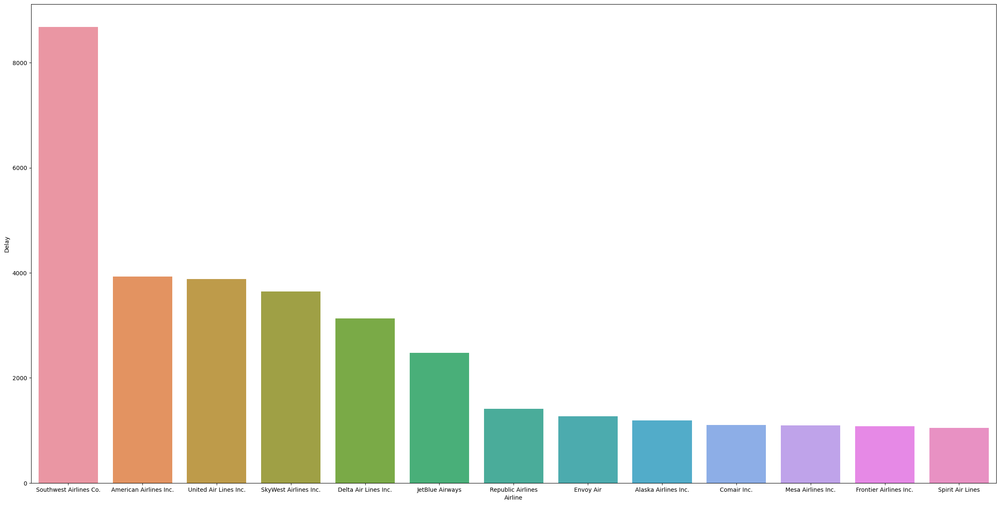

In [19]:
plt.figure(figsize=(30,15))
sns.barplot(x='Airline', y='Delay', data=dealy_airline.head(13))
plt.show()

In [26]:
df_train['Airline'].value_counts().head(7)

Southwest Airlines Co.    182113
Delta Air Lines Inc.       89750
SkyWest Airlines Inc.      86867
United Air Lines Inc.      84070
American Airlines Inc.     82755
JetBlue Airways            41643
Republic Airlines          33582
Name: Airline, dtype: int64

In [17]:
airline_delay = df_train.groupby(['Airline', 'Delay'])['ID'].count().unstack().fillna(0)
top = airline_delay.sum(axis=1).sort_values(ascending=False).head(7).index
top_data = airline_delay.loc[top]
top_data = top_data[['Not_Delayed', 'Delayed']]

In [19]:
top_data.head(7)

Delay,Not_Delayed,Delayed
Airline,,
Southwest Airlines Co.,37462,8682
Delta Air Lines Inc.,20772,3132
SkyWest Airlines Inc.,18416,3644
United Air Lines Inc.,17512,3881
American Airlines Inc.,16941,3929
JetBlue Airways,7707,2479
Republic Airlines,7285,1412


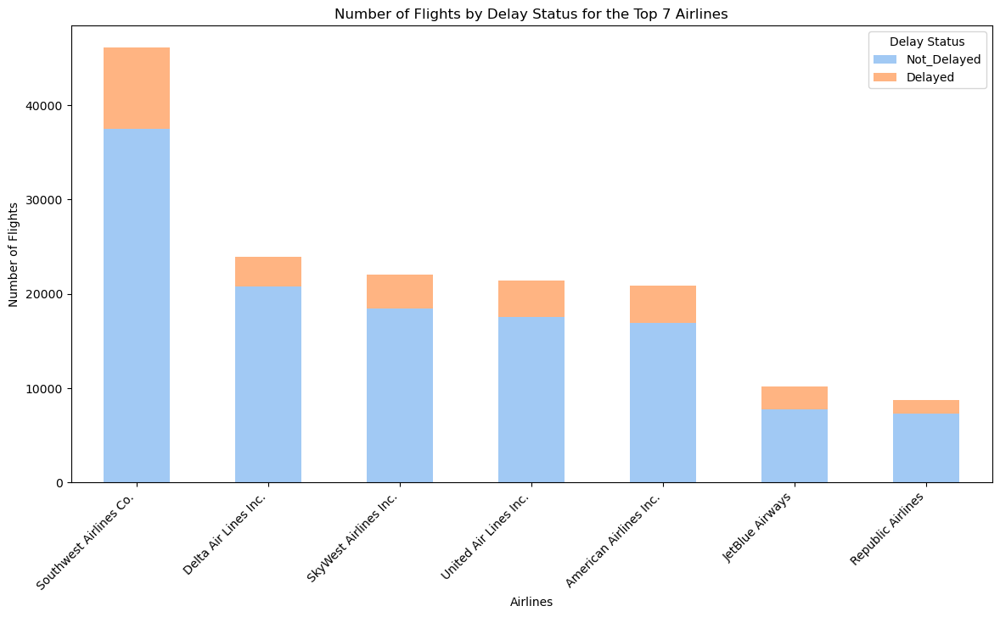

In [15]:
sns.set_palette("pastel")
top_data.plot(kind='bar', stacked=True, figsize=(14, 7))
plt.title('Number of Flights by Delay Status for the Top 7 Airlines')
plt.ylabel('Number of Flights')
plt.xlabel('Airlines')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Delay Status')
plt.show()

In [20]:
dealy_state = df_train[df_train['Delay'] == 'Delayed']['Origin_State'].value_counts().reset_index()

In [21]:
dealy_state.columns = ['state', 'Delay']
dealy_state.set_index('state', inplace=True)

In [22]:
myscale = (dealy_state['Delay'].quantile((0, 0.2, 0.4, 0.6, 0.8, 1))).tolist()
us_map = folium.Map(location=[40, -95], zoom_start=4)
folium.Choropleth(geo_data=r'C:\Users\seono\iitp_airplane\data\us-states.json',
                          data = dealy_state['Delay'], 
                          columns = [dealy_state.index, dealy_state['Delay']],
                          key_on='feature.properties.name',
                          threshold_scale = myscale,
                          fill_color='BuPu',
                          fill_opacity=0.5, 
                          line_opacity=0.3, 
                          legend_name='Flight Delay Rate (%)').add_to(us_map)
us_map

In [24]:
df_train['Origin_State'].value_counts().head(10)

California        103482
Texas              89074
Florida            66426
Illinois           58765
New York           43613
Georgia            42244
Colorado           39795
North Carolina     35411
Virginia           34088
Washington         25555
Name: Origin_State, dtype: int64

In [23]:
dealy_state['Delay'].sort_values(ascending=False).head(10)

state
California        4515
Texas             4232
Illinois          3137
Florida           3060
New York          2253
Colorado          1977
Georgia           1684
North Carolina    1566
Virginia          1532
New Jersey        1288
Name: Delay, dtype: int64

In [5]:
def season(i):
    if i in [12, 1, 2]:
        return 'winter'
    elif i in [3, 4, 5]:
        return 'spring'
    elif i in [6, 7, 8]:
        return 'summer'
    elif i in [9, 10, 11]:
        return 'autumn'

In [6]:
df_train['Season'] = df_train['Month'].apply(season)

In [8]:
df_train['Season'].value_counts()

autumn    293785
summer    239108
winter    237206
spring    229901
Name: Season, dtype: int64

In [11]:
dealy_season = df_train[df_train['Delay'] == 'Delayed']['Season'].value_counts().reset_index()
dealy_season.columns = ['Season', 'Delay']

In [12]:
dealy_season.head()

,Season,Delay
0,summer,12310
1,autumn,11419
2,winter,11060
3,spring,10211


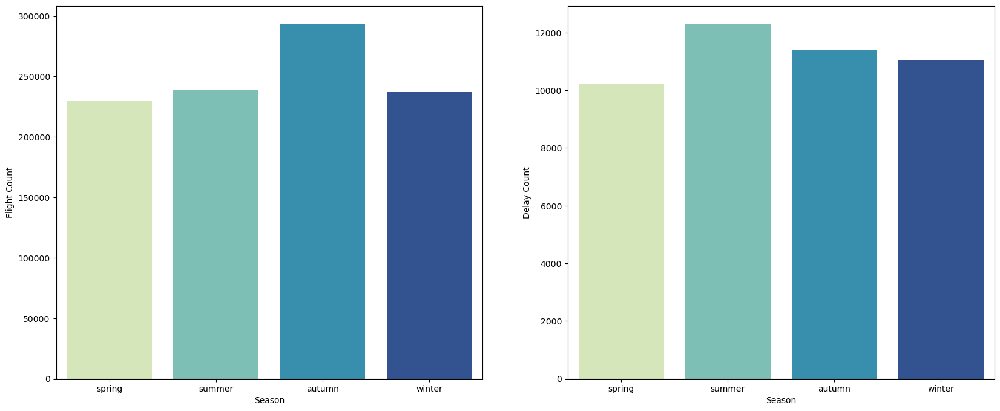

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.countplot(data=df_train, x='Season', palette='YlGnBu', ax=axes[0])
axes[0].set_ylabel('Flight Count')

sns.barplot(data=dealy_season, x='Season', y='Delay', palette='YlGnBu',
            order = ['spring', 'summer', 'autumn', 'winter'],  ax=axes[1])
axes[1].set_ylabel('Delay Count')

plt.show()